# Import packages

In [1]:
# Additional packages
import binance
import ta
import pandas as pd
import matplotlib.pyplot as plt

#Standard packages
from datetime import datetime
import requests
import os
import numpy as np
import ccxt

# Define client, download and clean historical data

In [2]:
# Get historical data from Binance
from binance.client import Client
client = Client()

# Define parameters
pairname = "ETHUSDT"
start_date = "17 august 2017"
time_interval = Client.KLINE_INTERVAL_1HOUR

# -- Load all price data from binance API -- #
klines_data = client.get_historical_klines(pairname, time_interval, start_date)
klines_data

# Transform data retrieved from Binance to dataframe // https://binance-docs.github.io/apidocs/spot/en/#kline-candlestick-data
raw_pricedata_df = None
raw_pricedata_df = pd.DataFrame(klines_data, columns = ['timestamp', 'open', 'high', 'low', 'close', 'volume', 'close_time', 'quote_av', 'trades', 'tb_base_av', 'tb_quote_av', 'ignore' ])

## CLEAN DATA
del raw_pricedata_df['ignore']
del raw_pricedata_df['close_time']
del raw_pricedata_df['quote_av']
del raw_pricedata_df['trades']
del raw_pricedata_df['tb_base_av']
del raw_pricedata_df['tb_quote_av']

#Transform open, close, high, low to numeric
raw_pricedata_df['open'] = pd.to_numeric(raw_pricedata_df['open'])
raw_pricedata_df['close'] = pd.to_numeric(raw_pricedata_df['close'])
raw_pricedata_df['high'] = pd.to_numeric(raw_pricedata_df['high'])
raw_pricedata_df['low'] = pd.to_numeric(raw_pricedata_df['low'])


##Convert TIME and set timestamp as index
raw_pricedata_df = raw_pricedata_df.set_index(raw_pricedata_df['timestamp'])
raw_pricedata_df.index = pd.to_datetime(raw_pricedata_df.index, unit='ms')
del raw_pricedata_df['timestamp']
print("Data fully loaded")
print(raw_pricedata_df)

Data fully loaded
                        open     high      low    close          volume
timestamp                                                              
2017-08-17 04:00:00   301.13   302.57   298.00   301.61    125.66877000
2017-08-17 05:00:00   301.61   303.28   300.00   303.10    377.67246000
2017-08-17 06:00:00   302.40   304.44   301.90   302.68    303.86672000
2017-08-17 07:00:00   302.68   307.96   302.60   307.96    754.74510000
2017-08-17 08:00:00   307.95   309.97   307.00   308.62    150.75029000
...                      ...      ...      ...      ...             ...
2023-02-28 14:00:00  1632.88  1647.52  1628.81  1634.91  29345.84250000
2023-02-28 15:00:00  1634.90  1643.53  1631.83  1641.30  22550.27550000
2023-02-28 16:00:00  1641.29  1646.38  1634.02  1635.57  20505.68370000
2023-02-28 17:00:00  1635.58  1644.77  1635.26  1643.82  12154.57770000
2023-02-28 18:00:00  1643.81  1645.87  1638.53  1642.05   6610.00750000

[48392 rows x 5 columns]


In [3]:
# Create graph to visualize data
import plotly.graph_objects as go

#Create graph object
fig = go.Figure()

#Set up the layout
fig.update_layout(
    title={
        'text':pairname,
        'x': 0.5,
        'xanchor': 'center'
        },
        xaxis_title = "Date",
        yaxis_title = "Price",
        xaxis_rangeslider_visible=False
)

fig.add_trace(
    go.Candlestick(
        x=raw_pricedata_df.index,
        open=raw_pricedata_df['open'],
        high=raw_pricedata_df['high'],
        low=raw_pricedata_df['low'],
        close=raw_pricedata_df['close']
    )
)
fig.show()


print(raw_pricedata_df)

                        open     high      low    close          volume
timestamp                                                              
2017-08-17 04:00:00   301.13   302.57   298.00   301.61    125.66877000
2017-08-17 05:00:00   301.61   303.28   300.00   303.10    377.67246000
2017-08-17 06:00:00   302.40   304.44   301.90   302.68    303.86672000
2017-08-17 07:00:00   302.68   307.96   302.60   307.96    754.74510000
2017-08-17 08:00:00   307.95   309.97   307.00   308.62    150.75029000
...                      ...      ...      ...      ...             ...
2023-02-28 14:00:00  1632.88  1647.52  1628.81  1634.91  29345.84250000
2023-02-28 15:00:00  1634.90  1643.53  1631.83  1641.30  22550.27550000
2023-02-28 16:00:00  1641.29  1646.38  1634.02  1635.57  20505.68370000
2023-02-28 17:00:00  1635.58  1644.77  1635.26  1643.82  12154.57770000
2023-02-28 18:00:00  1643.81  1645.87  1638.53  1642.05   6610.00750000

[48392 rows x 5 columns]


# Define technical indicators

In [20]:
## -- Define price data df --- ## 

pricedata_df = None
pricedata_df = raw_pricedata_df.copy()

# -- Trix Indicator --
trixLength = 26
trixSignal = 18

pricedata_df['TRIX'] = ta.trend.ema_indicator(ta.trend.ema_indicator(ta.trend.ema_indicator(close=pricedata_df['close'], window=trixLength), window=trixLength), window=trixLength)
pricedata_df['TRIX_PCT'] = pricedata_df["TRIX"].pct_change()*100 # calcule le % de variation P/r a la ligne précédente / example: data = [[10, 18, 11], [20, 15, 8], [30, 20, 3]] df = pd.DataFrame(data) print(df.pct_change())
pricedata_df['TRIX_SIGNAL'] = ta.trend.sma_indicator(pricedata_df['TRIX_PCT'],trixSignal)
pricedata_df['TRIX_HISTO'] = pricedata_df['TRIX_PCT'] - pricedata_df['TRIX_SIGNAL']
# TRIX HISTO : buy signal = TRIX PCT croise TRIX SIGNAL A LA HAUSSE, donc quand TRIX PCT > TRIX SIGNAL, soit TRIX HISTO > 0

# -- Stochasitc RSI --#
stochWindow = 10
stochTop = 0.82
stochBottom = 0.2
pricedata_df['STOCH_RSI'] = ta.momentum.stochrsi(close=pricedata_df['close'], window=stochWindow, smooth1=3, smooth2=3)
# stoch RSI parameters (standard)


# Add moving average cross not to trade in downtrends
short_sma = 40
long_sma = 400
pricedata_df['SMASHORT'] = ta.trend.sma_indicator(pricedata_df['close'], short_sma)
pricedata_df['SMALONG'] = ta.trend.sma_indicator(pricedata_df['close'], long_sma)


# Add AO to spot trend
#aoParam1 = 6
#aoParam2 = 22
#pricedata_df['AO'] = ta.momentum.awesome_oscillator(pricedata_df['high'],pricedata_df['low'],window1=aoParam1,window2=aoParam2)

print("Indicators fully loaded")
pricedata_df


Indicators fully loaded


,open,high,low,close,volume,TRIX,TRIX_PCT,TRIX_SIGNAL,TRIX_HISTO,STOCH_RSI,SMASHORT,SMALONG
timestamp,,,,,,,,,,,,
2017-08-17 04:00:00,301.13,302.57,298.00,301.61,125.66877000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-17 05:00:00,301.61,303.28,300.00,303.10,377.67246000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-17 06:00:00,302.40,304.44,301.90,302.68,303.86672000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-17 07:00:00,302.68,307.96,302.60,307.96,754.74510000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-08-17 08:00:00,307.95,309.97,307.00,308.62,150.75029000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-28 14:00:00,1632.88,1647.52,1628.81,1634.91,29345.84250000,1625.078541,0.017908,0.030591,-0.012683,0.877991,1633.90525,1626.446900
2023-02-28 15:00:00,1634.90,1643.53,1631.83,1641.30,22550.27550000,1625.358600,0.017234,0.029217,-0.011984,1.000000,1633.90375,1626.703875
2023-02-28 16:00:00,1641.29,1646.38,1634.02,1635.57,20505.68370000,1625.629763,0.016683,0.027866,-0.011183,0.691360,1633.85625,1626.958100


# Spot backtest

### Define key variables

In [21]:
# -- Define the period on which you want to run the backtest
backtest_start_date = '2020-01-01'
backtest_end_date = '2023-02-27'
test_pricedata_df = None
test_pricedata_df = pricedata_df[backtest_start_date:backtest_end_date].copy()
#test_pricedata_df = pricedata_df.copy()

# -- Key variables initialisation --
usdt = 1000 # montant initial en usdt
makerFee = 0.0010
takerFee = 0.0010
initialWallet = usdt
wallet = usdt
coin = 0
lastAth = 0
stopLoss = 0 # valeur aberrante pour initialiser
takeProfit = 500000 # valeur aberrante pour initialiser
# buyReady = True # variable qui permet de savoir si on est in the market on non, idem pour sell ready
# sellReady = True


# Define buy and sell conditions

In [22]:
# Fonctions permettant de définir les buy and sell conditions

# -- Condition to BUY market --
def buyCondition(row):
  if row['TRIX_HISTO'] > 0 and row['STOCH_RSI'] < stochTop and row['SMASHORT'] > row['SMALONG']:
    return True
  else:
    return False

# -- Condition to SELL market --  
def sellCondition(row):
  if row['TRIX_HISTO'] < 0 and row['STOCH_RSI'] > stochBottom:
    return True
  else:
    return False


# Backtest

In [23]:
# -- Initialisation des listes utilisées pour stocker la donnée
list =[]
list_detailed_report = []
trades = []
detailedReport = []


# -- Iteration on all your price dataset (df) --
for index, row in test_pricedata_df.iterrows():
  # -- Buy market order --
  if buyCondition(row) and usdt > 0 and buyReady == True:
    # -- You can define here at what price you buy --
    buyPrice = row['close']
    # -- Define the price of you SL and TP or comment it if you don't want a SL or TP --
    #stopLoss = buyPrice - 0.25 * buyPrice
    #takeProfit = buyPrice + 0.04 * buyPrice

    coin = usdt / buyPrice # modelisation de l'achat du coin
    fee = takerFee * coin #compute fee
    coin = coin - fee # update coin amount
    usdt = 0 #update usdt amount
    wallet = coin * row['close'] # update wallet amount

    # -- Check if your wallet hit a new ATH to know the drawBack --
    if wallet > lastAth:
      lastAth = wallet # l'ath est initialisé a zéro puis calculé à partir du max

    # -- You can uncomment the line below if you want to see logs --
    # print("Buy COIN at",buyPrice,'$ the', index)

    # -- Add the trade to DT to analyse it later --
    list = [index, "Buy", "Buy Market Order", buyPrice, fee * row['close'], usdt, coin, wallet,(wallet-lastAth)/lastAth]
    trades.append(list)
  
  # -- Stop Loss -- décommenter pour ajouter un SL
  # elif row['low'] < stopLoss and coin > 0:
  #   sellPrice = stopLoss
  #   usdt = coin * sellPrice
  #   fee = makerFee * usdt
  #   usdt = usdt - fee
  #   coin = 0
  #   buyReady = False
  #   wallet = usdt
    
  #   if wallet > lastAth:
  #     lastAth = wallet
    
  #   list = [index, "Stop loss", "Sell Market Order", sellPrice, fee * row['close'], usdt, coin, wallet,(wallet-lastAth)/lastAth]
  #   trades.append(list)

# -- Check if your wallet hit a new ATH to know the drawBack --
    # if wallet > lastAth:
    #   lastAth = wallet
      
    # # -- You can uncomment the line below if you want to see logs --
    # # print("Sell COIN at Stop Loss",sellPrice,'$ the', index)

    # # -- Add the trade to DT to analyse it later --
    # list = [index, "Sell", "Sell Stop Loss", sellPrice, fee, usdt, coin, wallet, (wallet-lastAth)/lastAth]
    # trades.append(list)    

  # -- Sell Market Order --
  elif sellCondition(row) and coin > 0 and sellReady == True:
    ## -- You can define here at what price you buy --##
    sellPrice = row['close']
    usdt = coin * sellPrice
    fee = takerFee * usdt
    usdt = usdt - fee
    coin = 0
    buyReady = True
    wallet = usdt

    # -- Check if your wallet hit a new ATH to know the drawBack --#
    if wallet > lastAth:
      lastAth = wallet

    # -- You can uncomment the line below if you want to see logs --  
    # print("Sell COIN at",sellPrice,'$ the', index)

    # -- Add the trade to DT to analyse it later --
    list = [index, "Sell", "Sell Market Order", sellPrice, fee, usdt, coin, wallet,(wallet-lastAth)/lastAth]
    trades.append(list)
  
  else: #si aucun trade, on historise la valorisation du portefeuille a chaque période (et pas seulement au moment des trades). Ca permet ensuite de calculer la daily valuation, le daily return et le sharpe ratio
    price = row['close']
    fee = 0
    if trades == []: #si aucun trade n'a été réalisé, on prend l'initial wallet par défaut
      usdt = initialWallet #on prend la dernière ligne de trades, et on va chercher le coin amount et le usdt amount
      coin = 0 #on prend la dernière ligne de trades, et on va chercher le coin amount et le usdt amount
    else:
      usdt = trades[-1][5] #on prend la dernière ligne de trades, et on va chercher le usdt amount
      coin = trades[-1][6] #on prend la dernière ligne de trades, et on va chercher le coin amount
      wallet = usdt + coin * price # calcul du wallet valuation
    # -- Check if your wallet hit a new ATH to know the drawBack --#
    if wallet > lastAth:
      lastAth = wallet
  
    list_detailed_report = [index, "No trade", "No order", price, fee, usdt, coin, wallet, (wallet-lastAth)/lastAth]
    detailedReport.append(list_detailed_report)
  


In [24]:
# *******************************************#
# ***** COMPUTE SHARPE & SORTINO RATIOS *****#
# *******************************************#

# Transformer la liste de trades en un data frame pour ensuite l'analyser
portfolio_evolution = []
portfolio_evolution =  detailedReport + trades # Concaténation des listes pour avoir l'historique complet des variations du portefeuille, heure par heure sur la période.

portfolio_evolution_df = None
# Définition du dataframe montrant l'évolution du portefeuille
portfolio_evolution_df = pd.DataFrame(portfolio_evolution, columns = ['date','position', 'reason', 'price', 'frais' ,'fiat', 'coins', 'wallet', 'drawBack'])
portfolio_evolution_df.drop(['frais', 'drawBack'], axis=1, inplace=True)
portfolio_evolution_df.sort_values(by='date', ascending=True)
portfolio_evolution_df['date'] = pd.to_datetime(portfolio_evolution_df['date'])
portfolio_evolution_df.set_index('date', inplace=True)
portfolio_evolution_df = portfolio_evolution_df.round(2).sort_index(ascending=True)
portfolio_evolution_df.tail(50)
#portfolio_evolution_df.info()

## Resampling to daily datapoints. Ici on transitionne la donnée heure par heure en jour par jour. Pour chaque jour, on prend la donnée de la dernière heure de la journée
daily_portfolio_df = portfolio_evolution_df.resample("D").agg({
    "position": "last",
    "reason": "last",
    "price": "last",
    "fiat": "last",
    "coins": "last",
    "wallet": "last",
    })

## Compute daily portfolio return // je suis en convention fin de journée, donc pas besoin de shift la donnée d'une ligne

daily_portfolio_df['daily_return'] = daily_portfolio_df['wallet'].diff()
daily_portfolio_df['daily_return_pct'] = daily_portfolio_df['wallet'].pct_change()*100

#### COMPUTE SHARPE RATIO ###

#Compute daily return average on the backtest period, and multiply by 365 because we use daily return data. 
avgYearlyReturn = daily_portfolio_df['daily_return_pct'].mean() * 365 ## multiply by 365 because we use daily return data and assets trade 365 days / year
avgYearlyVol = daily_portfolio_df['daily_return_pct'].std() * 365**0.5 ## multiply by racine de 365 because volatitliy is a function of square root of time
sharpeRatio = round(avgYearlyReturn / avgYearlyVol, 2)

### COMPUTE SORTINO RATIO ###

sortinoRatio = (365*daily_portfolio_df["daily_return_pct"].mean()) / (daily_portfolio_df["daily_return_pct"][daily_portfolio_df["daily_return_pct"] < 0].std()* 365**0.5)
sortinoRatio = round(sortinoRatio, 2)

##### Great article on resampling data set: https://www.alpharithms.com/aggregating-time-series-data-with-pandas-resampling-411212/
### Check if there are missing data points: https://www.alpharithms.com/aggregating-time-series-data-with-pandas-resampling-411212/
# missing_datapoints = pd.date_range(portfolio_evolution_df.index.min(), portfolio_evolution_df.index.max(), freq='h').difference(portfolio_evolution_df.index)
# print(missing_datapoints)
# Python frequency aliases: https://pandas.pydata.org/docs/user_guide/timeseries.html#timeseries-offset-aliases

# *** Annualized returns and volatility resources *** #
# **Annualized returns**
# [https://www.assetmacro.com/financial-terms/annualized-return/#:~:text=Annualized Return is the average,252 trading days of year](https://www.assetmacro.com/financial-terms/annualized-return/#:~:text=Annualized%20Return%20is%20the%20average,252%20trading%20days%20of%20year)).
# **Annualized volatility*
# [https://www.macroption.com/why-is-volatility-proportional-to-square-root-of-time/](https://www.macroption.com/why-is-volatility-proportional-to-square-root-of-time/)
# [https://www.quora.com/Why-do-we-need-to-multiply-by-the-square-root-of-12-instead-of-the-simple-number-12-to-calculate-annualized-standard-deviation](https://www.quora.com/Why-do-we-need-to-multiply-by-the-square-root-of-12-instead-of-the-simple-number-12-to-calculate-annualized-standard-deviation)
# [https://study.com/academy/lesson/annualized-volatility-definition-formula.html](https://study.com/academy/lesson/annualized-volatility-definition-formula.html)
# [https://www.google.com/search?q=why+square+root+N)+annualizes&oq=why+square+root+N)+annualizes+&aqs=chrome..69i57.9243j0j4&sourceid=chrome&ie=UTF-8](https://www.google.com/search?q=why+square+root+N)+annualizes&oq=why+square+root+N)+annualizes+&aqs=chrome..69i57.9243j0j4&sourceid=chrome&ie=UTF-8)


In [25]:
# Transformer la liste de trades en un data frame pour ensuite l'analyser
trades_df = None
trades_df = pd.DataFrame(trades, columns = ['date','position', 'reason', 'price', 'frais' ,'fiat', 'coins', 'wallet', 'drawBack'])
trades_df

# -- BackTest Analyses --
trades_df = trades_df.set_index(trades_df['date']) # set index and transform to datetime
trades_df.index = pd.to_datetime(trades_df.index) #transformer
trades_df.rename(columns = {'date':'date_and_time'}, inplace = True) # rename col to avoid ambiguity
trades_df['resultat'] = trades_df['wallet'].diff() # calcul de la différence de la valo du wallet entre chaque ordre (achat/vente)
trades_df['resultat%'] = trades_df['wallet'].pct_change()*100 # calcul du différentiel en %
trades_df.loc[trades_df['position']=='Buy','resultat'] = None # set la variation a zéro pour tous les achats (1 trade = 2 ordres, 1 achat puis une vente)
trades_df.loc[trades_df['position']=='Buy','resultat%'] = None

trades_df['tradeIs'] = ''
trades_df.loc[trades_df['resultat']>0,'tradeIs'] = 'Good' #permet de savoir si le trade est profitable ou non pour calculer le win rate
trades_df.loc[trades_df['resultat']<=0,'tradeIs'] = 'Bad' 

iniClose = test_pricedata_df.iloc[0]['close'] # on récupère le cours de l'actif à la date de début, pour calculer la perf
lastClose = test_pricedata_df.iloc[len(test_pricedata_df)-1]['close'] # recupération du cours de fin pour calculer la perf
holdPercentage = ((lastClose - iniClose)/iniClose) * 100 # perf buy and hold
algoPercentage = ((wallet - initialWallet)/initialWallet) * 100 #perf de l'ago
vsHoldPercentage = ((algoPercentage - holdPercentage)/holdPercentage) * 100

trades_df

,date_and_time,position,reason,price,frais,fiat,coins,wallet,drawBack,resultat,resultat%,tradeIs
date,,,,,,,,,,,,
2020-01-01 17:00:00,2020-01-01 17:00:00,Buy,Buy Market Order,132.34,1.000000,0.000000,7.548738,999.000000,-0.001000,NaN,NaN,
2020-01-02 09:00:00,2020-01-02 09:00:00,Sell,Sell Market Order,129.98,0.981185,980.203793,0.000000,980.203793,-0.019796,-18.796207,-1.881502,Bad
2020-01-03 14:00:00,2020-01-03 14:00:00,Buy,Buy Market Order,131.68,0.980204,0.000000,7.436388,979.223589,-0.020776,NaN,NaN,
2020-01-04 22:00:00,2020-01-04 22:00:00,Sell,Sell Market Order,134.10,0.997220,996.222429,0.000000,996.222429,-0.004711,16.998840,1.735951,Good
2020-01-05 06:00:00,2020-01-05 06:00:00,Buy,Buy Market Order,136.11,0.996222,0.000000,7.311926,995.226207,-0.005706,NaN,NaN,
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-20 15:00:00,2023-02-20 15:00:00,Buy,Buy Market Order,1707.23,14.169717,0.000000,8.291529,14155.547203,-0.272971,NaN,NaN,
2023-02-21 09:00:00,2023-02-21 09:00:00,Sell,Sell Market Order,1684.26,13.965091,13951.125689,0.000000,13951.125689,-0.283470,-204.421514,-1.444109,Bad
2023-02-23 05:00:00,2023-02-23 05:00:00,Buy,Buy Market Order,1664.83,13.951126,0.000000,8.371530,13937.174564,-0.284187,NaN,NaN,


In [26]:
## -- Compute trades average performance
try:
    tradesPerformance = round(trades_df.loc[(trades_df['tradeIs'] == 'Good') | (trades_df['tradeIs'] == 'Bad'), 'resultat%'].sum()
            / trades_df.loc[(trades_df['tradeIs'] == 'Good') | (trades_df['tradeIs'] == 'Bad'), 'resultat%'].count(), 2)
except:
    tradesPerformance = 0
    print("/!\ There is no Good or Bad Trades in your BackTest, maybe a problem...")

## -- Compute total good trades

try:
    totalGoodTrades = trades_df.groupby('tradeIs')['date_and_time'].nunique()['Good']
    AveragePercentagePositivTrades = round(trades_df.loc[trades_df['tradeIs'] == 'Good', 'resultat%'].sum()
                                           / trades_df.loc[trades_df['tradeIs'] == 'Good', 'resultat%'].count(), 2)
    idbest = trades_df.loc[trades_df['tradeIs'] == 'Good', 'resultat%'].idxmax()
    bestTrade = str(
        round(trades_df.loc[trades_df['tradeIs'] == 'Good', 'resultat%'].max(), 2))
except:
    totalGoodTrades = 0
    AveragePercentagePositivTrades = 0
    idbest = ''
    bestTrade = 0
    print("/!\ There is no Good Trades in your BackTest, maybe a problem...")

## -- Compute total bad trades
try:
    totalBadTrades = trades_df.groupby('tradeIs')['date_and_time'].nunique()['Bad']
    AveragePercentageNegativTrades = round(trades_df.loc[trades_df['tradeIs'] == 'Bad', 'resultat%'].sum()
                                           / trades_df.loc[trades_df['tradeIs'] == 'Bad', 'resultat%'].count(), 2)
    idworst = trades_df.loc[trades_df['tradeIs'] == 'Bad', 'resultat%'].idxmin()
    worstTrade = round(trades_df.loc[trades_df['tradeIs'] == 'Bad', 'resultat%'].min(), 2)
except:
    totalBadTrades = 0
    AveragePercentageNegativTrades = 0
    idworst = ''
    worstTrade = 0
    print("/!\ There is no Bad Trades in your BackTest, maybe a problem...")

#Total trades and win rate
totalTrades = totalBadTrades + totalGoodTrades
winRateRatio = (totalGoodTrades/totalTrades) * 100

reasons = trades_df['reason'].unique()

In [27]:
print("Pair Symbol :",pairname)
print("Period : [" + str(test_pricedata_df.index[0]) + "] -> [" +
      str(test_pricedata_df.index[len(test_pricedata_df)-1]) + "]")
print("Starting balance :", initialWallet, "$")

print("\n----- General Info -----")
print("Final balance :", round(wallet, 2), "$")
print("Performance vs US Dollar :", round(algoPercentage, 2), "%")
print("Buy and Hold Performence :", round(holdPercentage, 2), "%")
print("Performance vs Buy and Hold :", round(vsHoldPercentage, 2), "%")
print("Best trade : +"+bestTrade, "%, the", idbest)
print("Worst trade :", worstTrade, "%, the", idworst)
print("Worst drawBack :", str(100*round(trades_df['drawBack'].min(), 2)), "%")
print("Total fees : ", round(trades_df['frais'].sum(), 2), "$")

print("\n------ Key Ratios ------")
print(f"Sharpe Ratio : {sharpeRatio}")
print(f"Sortino Ratio : {sortinoRatio}")

print("\n----- Trades Info -----")
print("Total trades on period :",totalTrades)
print("Number of positive trades :", totalGoodTrades)
print("Number of negative trades : ", totalBadTrades)
print("Trades win rate ratio :", round(winRateRatio, 2), '%')
print("Average trades performance :",tradesPerformance,"%")
print("Average positive trades :", AveragePercentagePositivTrades, "%")
print("Average negative trades :", AveragePercentageNegativTrades, "%")

print("\n----- Trades Stats -----")
reasons = trades_df['reason'].unique()
for r in reasons:
    print(r+" number :", trades_df.groupby('reason')['date_and_time'].nunique()[r])

Pair Symbol : ETHUSDT
Period : [2020-01-01 00:00:00] -> [2023-02-27 23:00:00]
Starting balance : 1000 $

----- General Info -----
Final balance : 13369.76 $
Performance vs US Dollar : 1236.98 %
Buy and Hold Performence : 1167.52 %
Performance vs Buy and Hold : 5.95 %
Best trade : +36.72 %, the 2021-01-04 23:00:00
Worst trade : -8.55 %, the 2022-08-19 15:00:00
Worst drawBack : -31.0 %
Total fees :  4001.1 $

------ Key Ratios ------
Sharpe Ratio : 2.05
Sortino Ratio : 3.09

----- Trades Info -----
Total trades on period : 231
Number of positive trades : 110
Number of negative trades :  121
Trades win rate ratio : 47.62 %
Average trades performance : 1.38 %
Average positive trades : 5.34 %
Average negative trades : -2.22 %

----- Trades Stats -----
Buy Market Order number : 232
Sell Market Order number : 231


In [28]:
import plotly.express as px

# Graph de l'évolution de mon wallet sur la période du backtest
fig1 = px.line(x=trades_df['date_and_time'], y=trades_df['wallet'], title="Wallet USD valuation")
fig1.update_traces(line_color='#0047AB', line_width=2)
fig1.show()

# Graph de l'évolution de mon portefeuille chaque jour sur la période du backtest (meme les jours sans trade)
fig2 = px.line(x=daily_portfolio_df.index, y=daily_portfolio_df['wallet'], title=f"Portfolio daily valuation - complete dataset ")
fig2.update_traces(line_color='#0047AB', line_width=2)
fig2.show()

# Graph de l'évolution du cours de l'actif sur la période du backtest
fig3 = px.line(x=pricedata_df[backtest_start_date:backtest_end_date].index, y=pricedata_df['close'][backtest_start_date:backtest_end_date], title=f"{pairname} price data")
fig3.update_traces(line_color='#A52A2A', line_width=2)
fig3.show()

# trades_df[['wallet', 'price']].plot(subplots=True, figsize=(20, 10)) => plot_pricedata_df = pricedata_df[startdate:enddate][close] => puis plot

### Compute Monthly Performance Metrics ###

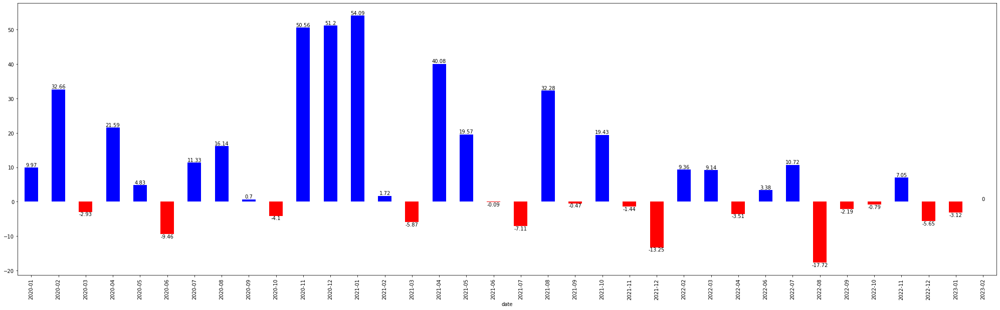

In [29]:
## COMPUTE MONTLY ROI ##
# Resource: https://stackoverflow.com/questions/25797038/filter-data-to-get-only-first-day-of-the-month-rows

## -- Create new periodic roi dataframe to agregate performance data per month-- ##
periodic_roi_df = None
periodic_roi_df = trades_df.copy()
periodic_roi_df.rename_axis('indexDates').rename_axis('metrics', axis='columns') # ne fonctionne pas tres bien

## -- Drop rows where position = "Buy" because there is no ROI to compute
periodic_roi_df.drop(periodic_roi_df[periodic_roi_df['position'] == 'Buy'].index, axis=0,inplace = True)

## -- Drop useless columns for this ROI computation
periodic_roi_df.drop(['reason', 'price', 'frais', 'drawBack', 'position', 'coins', 'fiat', 'resultat', 'resultat%', 'tradeIs'], axis=1, inplace=True)

#Insert year and year_month columns to specific positions in data frame 
periodic_roi_df.insert(0,'year',periodic_roi_df['date_and_time'].dt.to_period('Y'))
periodic_roi_df.insert(1,'year_month',periodic_roi_df['date_and_time'].dt.to_period('M'))

## Insert column cleanDate to df at a specific position
periodic_roi_df.insert(2,'cleanDate',periodic_roi_df['date_and_time'].dt.date)
periodic_roi_df

## -- COMPUTE MONTHLY PERFORMANCE DATA -- ##

## Group values by 1st day of each month
periodic_roi_df.sort_index(ascending=True) # sort so that df is sorted ascending so that the .nth() method returns the first value of each month

## Créer nouveau data frame pour stocker les métriques de perf mensuelles
monthly_perf_df = None

## -- Grouper la donnée par mois et sélectionner la première entrée pour chaque mois -- ##
monthly_perf_df = periodic_roi_df.groupby(pd.DatetimeIndex(periodic_roi_df.index).to_period('M')).nth(0)
monthly_perf_df
## Pandas grouper : https://stackoverflow.com/questions/45156289/pandas-where-is-the-documentation-for-timegrouper
## Resource on groupy by first last, nth() : https://stackoverflow.com/questions/55583246/what-is-different-between-groupby-first-groupby-nth-groupby-head-when-as-index
#grouped_df = periodic_roi_df.groupby(pd.Grouper(periodic_roi_df['year_month']).count().sort_values(by='position', ascending=True)
#grouped_df = periodic_roi_df.groupby(pd.Grouper(axis=0,freq='M')).count()

## -- Compute difference with the previous row -- ##
monthly_perf_df['monthly_perf_v1'] = monthly_perf_df['wallet'].diff()
monthly_perf_df['monthly_perf%_v1'] = monthly_perf_df['wallet'].pct_change()*100
monthly_perf_df['monthly_perf'] = monthly_perf_df['monthly_perf_v1'].shift(-1) # shift rows up so performance is mapped with the right month
monthly_perf_df['monthly_perf%'] = monthly_perf_df['monthly_perf%_v1'].shift(-1) # shift rows up so performance is mapped with the right month
monthly_perf_df['monthly_perf_pct_v1'] = monthly_perf_df['wallet'].pct_change()
monthly_perf_df['monthly_perf_pct'] = monthly_perf_df['monthly_perf_pct_v1'].shift(-1)
monthly_perf_df['monthly_perf_coeff'] = monthly_perf_df['monthly_perf_pct'] +1 # to compute monthly CAGR
monthly_perf_df.drop(['monthly_perf_v1', 'monthly_perf%_v1','monthly_perf_pct_v1', 'monthly_perf_pct'], axis=1, inplace=True)

## Up month and down month
monthly_perf_df['status'] = ''
monthly_perf_df.loc[monthly_perf_df['monthly_perf']>0,'status'] = 1 #permet de savoir si le trade est profitable ou non pour calculer le win rate
monthly_perf_df.loc[monthly_perf_df['monthly_perf']<=0,'status'] = 0 
monthly_perf_df["status"] = monthly_perf_df["status"].apply(pd.to_numeric)

monthly_perf_df = monthly_perf_df.round(2)
monthly_perf_df

# Plot monthly returns 
fig = plt.figure(figsize =(35,10))
ax = monthly_perf_df['monthly_perf%'].plot(kind='bar', color=(monthly_perf_df['monthly_perf%']>0).map({True:'b', False:'r'}))
ax.bar_label(ax.containers[0])
plt.show()

## Compute Yearly Metrics ##

In [30]:
## Yearly performance metrics
yearly_perf_df = None
yearly_perf_df = periodic_roi_df.groupby(pd.DatetimeIndex(periodic_roi_df.index).to_period('Y')).nth(0)

yearly_perf_df['yearly_perf_v1'] = yearly_perf_df['wallet'].diff()
yearly_perf_df['yearly_perf%_v1'] = yearly_perf_df['wallet'].pct_change()*100
yearly_perf_df['yearly_perf'] = yearly_perf_df['yearly_perf_v1'].shift(-1) # shift rows up so performance is mapped with the right month
yearly_perf_df['yearly_perf%'] = yearly_perf_df['yearly_perf%_v1'].shift(-1) # shift rows up so performance is mapped with the right month
yearly_perf_df.drop(['yearly_perf_v1', 'yearly_perf%_v1'], axis=1, inplace=True)
yearly_perf_df['monthly_cagr%'] = (((yearly_perf_df['yearly_perf%']/100) + 1)**(1/12) -1)*100 ## Compute monthly CAGR
# https://www.epargnant30.fr/cagr/ 
# https://stackoverflow.com/questions/37400872/pandas-calculate-cagr-with-slicing-missing-values

### --- Compute average monthly ROI --- ###
avg_monthly_roi_df = monthly_perf_df.groupby(['year'])[['monthly_perf', 'monthly_perf%']].mean(numeric_only=True).rename(columns={'monthly_perf':'avg_mthly_perf','monthly_perf%' : 'avg_mthly_perf%'})

### --- Compute best and worst months --- ###
nb_up_months_df = monthly_perf_df.groupby(['year'])[['status']].sum(numeric_only=True).rename(columns={'status':'nb_up_months'})
max_monthly_roi_df = monthly_perf_df.groupby(['year'])[['monthly_perf', 'monthly_perf%']].max(numeric_only=True).rename(columns={'monthly_perf':'max_mthly_perf','monthly_perf%' : 'max_mthly_perf%'})
min_monthly_roi_df = monthly_perf_df.groupby(['year'])[['monthly_perf', 'monthly_perf%']].min(numeric_only=True).rename(columns={'monthly_perf':'min_mthly_perf','monthly_perf%' : 'min_mthly_perf%'})

monthly_cagr_df = monthly_perf_df.groupby(['year'])[['monthly_perf_coeff']].prod(numeric_only=True).rename(columns={'monthly_perf_coeff':'monthly_cagr'})

### -- Compute Yearly Metrics Dashboard -- ##

yearly_metrics_df = None
#yearly_perf_df.drop(['year_month', 'cleanDate', 'date_and_time'], axis=1, inplace=True) # delete useless cols

yearly_metrics_df = pd.merge(left=yearly_perf_df, right=nb_up_months_df, left_on='year', right_on='year')
yearly_metrics_df = pd.merge(left=yearly_metrics_df, right=avg_monthly_roi_df, left_on='year', right_on='year')
yearly_metrics_df  = pd.merge(left=yearly_metrics_df, right=max_monthly_roi_df, left_on='year', right_on='year')
yearly_metrics_df = pd.merge(left=yearly_metrics_df, right=min_monthly_roi_df, left_on='year', right_on='year')
yearly_metrics_df = yearly_metrics_df.round(2)
yearly_metrics_df


,year,year_month,cleanDate,date_and_time,wallet,yearly_perf,yearly_perf%,monthly_cagr%,nb_up_months,avg_mthly_perf,avg_mthly_perf%,max_mthly_perf,max_mthly_perf%,min_mthly_perf,min_mthly_perf%
0,2020,2020-01,2020-01-02,2020-01-02 09:00:00,980.20,3573.80,364.60,13.66,9.0,297.82,15.21,1542.16,51.20,-167.42,-9.46
1,2021,2021-01,2021-01-04,2021-01-04 23:00:00,4554.00,9486.40,208.31,9.84,6.0,790.53,11.58,3371.56,54.09,-2145.04,-13.25
2,2022,2022-02,2022-02-02,2022-02-02 08:00:00,14040.40,883.45,6.29,0.51,5.0,88.35,0.98,1791.91,10.72,-3280.19,-17.72
3,2023,2023-01,2023-01-03,2023-01-03 12:00:00,14923.85,NaN,NaN,NaN,0.0,-465.39,-3.12,-465.39,-3.12,-465.39,-3.12


## Run P Significance Test on Sharpe Ratios of Simulated Backtests with Shuffled Price Data ##

In [17]:
# Build a DF containing all the price changes of the price data set
test_rpd_df = None
test_rpd_df = raw_pricedata_df['2020-01-01':'2023-01-01'].copy()
test_rpd_df['price_change'] = test_rpd_df['close'].pct_change()
test_rpd_df.drop(columns=['open', 'high', 'low', 'volume'], inplace=True)
test_rpd_df.drop(index=test_rpd_df.index[0], axis=0, inplace=True) # drop first row
test_rpd_df['shuffled_price_change'] = np.random.permutation(test_rpd_df.price_change) # shuffle the price changes

test_rpd_df['old_close'] = test_rpd_df['close']
# Iterate on each row
for k in range (1, len(test_rpd_df)-1):
    test_rpd_df['close'][k] = test_rpd_df['close'][k-1]*(1+test_rpd_df['shuffled_price_change'][k])


test_rpd_df

# use this article to run simulation faster
#https://medium.com/the-handbook-of-coding-in-finance/simulating-random-walk-of-stock-prices-with-monte-carlo-simulation-in-python-6e233d841e


,close,price_change,shuffled_price_change,old_close
timestamp,,,,
2020-01-01 01:00:00,130.640000,0.013735,-0.001517,130.64
2020-01-01 02:00:00,130.919966,0.001607,0.002143,130.85
2020-01-01 03:00:00,130.678813,-0.004968,-0.001842,130.20
2020-01-01 04:00:00,131.293957,0.000000,0.004707,130.20
2020-01-01 05:00:00,131.815604,0.000768,0.003973,130.30
...,...,...,...,...
2023-01-01 19:00:00,1208.955239,0.000716,-0.004254,1201.78
2023-01-01 20:00:00,1208.289230,-0.000316,-0.000551,1201.40
2023-01-01 21:00:00,1201.937817,0.001207,-0.005257,1202.85


In [18]:
import plotly.express as px

# Graph de l'évolution de la nouvelle courbe de prix random
fyg = px.line(x=test_rpd_df.index, y=test_rpd_df['close'], title="New price curve generating through random shuffling of price changes")
fyg.update_traces(line_color='#0047AB', line_width=2)
fyg.show()

# Graph de l'évolution de l'ancienne courbe de prix
fyg = px.line(x=test_rpd_df.index, y=test_rpd_df['old_close'], title="Wallet USD valuation")
fyg.update_traces(line_color='#0047AB', line_width=2)
fyg.show()

In [19]:
# ***************************************************************************************************** #
# Créer une fonction qui run le backtest sur un data set de prix shuffled et renvoie le SHARPE RATIO #
# ***************************************************************************************************** #

def run_backtest_sharpe (raw_pd_df, s_date, e_date):
      
  # ***  Shuffle crypto prices on the period *** #
  test_rpd_df = None
  test_rpd_df = raw_pd_df[s_date:e_date].copy()
  test_rpd_df['price_change'] = test_rpd_df['close'].pct_change()
  test_rpd_df.drop(columns=['open', 'high', 'low', 'volume'], inplace=True)
  test_rpd_df.drop(index=test_rpd_df.index[0], axis=0, inplace=True) # drop first row
  test_rpd_df['shuffled_price_change'] = np.random.permutation(test_rpd_df.price_change) # shuffle the price changes

  test_rpd_df['old_close'] = test_rpd_df['close']
  # Iterate on each row to compute the new price curve
  for k in range (1, len(test_rpd_df)-1):
      test_rpd_df['close'][k] = test_rpd_df['close'][k-1]*(1+test_rpd_df['shuffled_price_change'][k])

  # **** ATTRIBUTION DE LA NOUVELLE PRICE CURVE à pricedata_df **** # 
  pricedata_df = test_rpd_df.copy()

  # -- Trix Indicator --
  trixLength = 26
  trixSignal = 18

  pricedata_df['TRIX'] = ta.trend.ema_indicator(ta.trend.ema_indicator(ta.trend.ema_indicator(close=pricedata_df['close'], window=trixLength), window=trixLength), window=trixLength)
  pricedata_df['TRIX_PCT'] = pricedata_df["TRIX"].pct_change()*100 # calcule le % de variation P/r a la ligne précédente / example: data = [[10, 18, 11], [20, 15, 8], [30, 20, 3]] df = pd.DataFrame(data) print(df.pct_change())
  pricedata_df['TRIX_SIGNAL'] = ta.trend.sma_indicator(pricedata_df['TRIX_PCT'],trixSignal)
  pricedata_df['TRIX_HISTO'] = pricedata_df['TRIX_PCT'] - pricedata_df['TRIX_SIGNAL']

  # -- Stochasitc RSI --#
  stochWindow = 10
  stochTop = 0.82
  stochBottom = 0.2
  pricedata_df['STOCH_RSI'] = ta.momentum.stochrsi(close=pricedata_df['close'], window=stochWindow, smooth1=3, smooth2=3)

  # Add moving average cross not to trade in downtrends
  short_sma = 40
  long_sma = 400
  pricedata_df['SMASHORT'] = ta.trend.sma_indicator(pricedata_df['close'], short_sma)
  pricedata_df['SMALONG'] = ta.trend.sma_indicator(pricedata_df['close'], long_sma)

  test_pricedata_df = None
  test_pricedata_df = pricedata_df[s_date:e_date].copy()

  usdt = 1000 # montant initial en usd
  takerFee = 0.0010
  initialWallet = usdt
  wallet = usdt
  coin = 0
  lastAth = 0
  buyReady = True # variable qui permet de savoir si on est in the market on non, idem pour sell ready
  sellReady = True


  # -- Initialisation des listes utilisées pour stocker la donnée
  list =[]
  list_detailed_report = []
  trades = []
  detailedReport = []

  # -- Iteration on all your price dataset (df) --
  for index, row in test_pricedata_df.iterrows():
    # -- Buy market order --
    if buyCondition(row) and usdt > 0 and buyReady == True:
      # -- You can define here at what price you buy --
      buyPrice = row['close']
      coin = usdt / buyPrice # modelisation de l'achat du coin
      fee = takerFee * coin #compute fee
      coin = coin - fee # update coin amount
      usdt = 0 #update usdt amount
      wallet = coin * row['close'] # update wallet amount

      # -- Check if your wallet hit a new ATH to know the drawBack --
      if wallet > lastAth:
        lastAth = wallet # l'ath est initialisé a zéro puis calculé à partir du max
      
      list = [index, "Buy", "Buy Market Order", buyPrice, fee * row['close'], usdt, coin, wallet,(wallet-lastAth)/lastAth]
      trades.append(list)

    # -- Sell Market Order --
    elif sellCondition(row) and coin > 0 and sellReady == True:
      ## -- You can define here at what price you buy --##
      sellPrice = row['close']
      usdt = coin * sellPrice
      fee = takerFee * usdt
      usdt = usdt - fee
      coin = 0
      buyReady = True
      wallet = usdt
    
      # -- Check if your wallet hit a new ATH to know the drawBack --#
      if wallet > lastAth:
        lastAth = wallet

      # -- Add the trade to DT to analyse it later --
      list = [index, "Sell", "Sell Market Order", sellPrice, fee, usdt, coin, wallet,(wallet-lastAth)/lastAth]
      trades.append(list)
    
    else: #si aucun trade, on historise la valorisation du portefeuille a chaque période (et pas seulement au moment des trades). Ca permet ensuite de calculer la daily valuation, le daily return et le sharpe ratio
      price = row['close']
      fee = 0
      if trades == []: #si aucun trade n'a été réalisé, on prend l'initial wallet par défaut
        usdt = initialWallet #on prend la dernière ligne de trades, et on va chercher le coin amount et le usdt amount
        coin = 0 #on prend la dernière ligne de trades, et on va chercher le coin amount et le usdt amount
      else:
        usdt = trades[-1][5] #on prend la dernière ligne de trades, et on va chercher le usdt amount
        coin = trades[-1][6] #on prend la dernière ligne de trades, et on va chercher le coin amount
        wallet = usdt + coin * price # calcul du wallet valuation
      # -- Check if your wallet hit a new ATH to know the drawBack --#
      if wallet > lastAth:
        lastAth = wallet
    
      list_detailed_report = [index, "No trade", "No order", price, fee, usdt, coin, wallet, (wallet-lastAth)/lastAth]
      detailedReport.append(list_detailed_report)


  # *******************************************#
  # ***** COMPUTE SHARPE RATIO *****#
  # *******************************************#

  # Transformer la liste de trades en un data frame pour ensuite l'analyser
  portfolio_evolution = []
  portfolio_evolution =  detailedReport + trades # Concaténation des listes pour avoir l'historique complet des variations du portefeuille, heure par heure sur la période.

  portfolio_evolution_df = None
  # Définition du dataframe montrant l'évolution du portefeuille
  portfolio_evolution_df = pd.DataFrame(portfolio_evolution, columns = ['date','position', 'reason', 'price', 'frais' ,'fiat', 'coins', 'wallet', 'drawBack'])
  portfolio_evolution_df.drop(['frais', 'drawBack'], axis=1, inplace=True)
  portfolio_evolution_df.sort_values(by='date', ascending=True)
  portfolio_evolution_df['date'] = pd.to_datetime(portfolio_evolution_df['date'])
  portfolio_evolution_df.set_index('date', inplace=True)
  portfolio_evolution_df = portfolio_evolution_df.round(2).sort_index(ascending=True)
  portfolio_evolution_df.tail(50)
  #portfolio_evolution_df.info()

  ## Resampling to daily datapoints. Ici on transitionne la donnée heure par heure en jour par jour. Pour chaque jour, on prend la donnée de la dernière heure de la journée
  
  daily_portfolio_df = portfolio_evolution_df.resample("D").agg({
      "position": "last",
      "reason": "last",
      "price": "last",
      "fiat": "last",
      "coins": "last",
      "wallet": "last",
      })

  ## Compute daily portfolio return // je suis en convention fin de journée, donc pas besoin de shift la donnée d'une ligne

  daily_portfolio_df['daily_return'] = daily_portfolio_df['wallet'].diff()
  daily_portfolio_df['daily_return_pct'] = daily_portfolio_df['wallet'].pct_change()*100

  #### COMPUTE SHARPE RATIO ###

  #Compute daily return average on the backtest period, and multiply by 365 because we use daily return data. 
  avgYearlyReturn = daily_portfolio_df['daily_return_pct'].mean() * 365 ## multiply by 365 because we use daily return data and assets trade 365 days / year
  avgYearlyVol = daily_portfolio_df['daily_return_pct'].std() * 365**0.5 ## multiply by racine de 365 because volatitliy is a function of square root of time
  sharpeRatio = round(avgYearlyReturn / avgYearlyVol, 2)
  
  return sharpeRatio

100%|██████████| 10/10 [00:24<00:00,  2.40s/it]

   sharpe_ratios
9           0.83
4           0.67
8           0.54
5           0.52
1           0.50
2           0.47
6           0.28
7           0.13
0          -0.07
3          -0.52


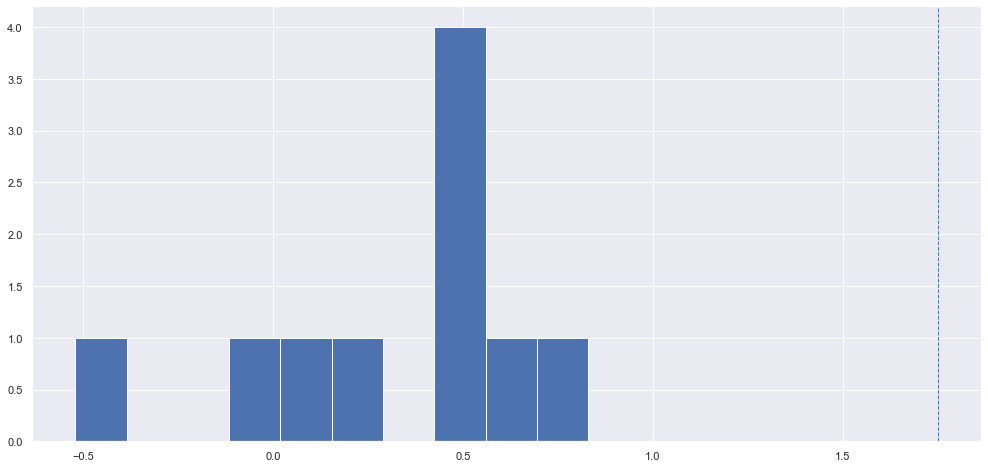

In [98]:
from tqdm import tqdm
import time

# Run 250 backtests with randomized prices 
runs = 10
sharpes = []

for run in tqdm(range(0, runs)):
    shrp = run_backtest_sharpe (raw_pricedata_df, '2020-01-01', '2023-02-01')
    sharpes.append(shrp)

print(pd.DataFrame(data=sharpes, columns=['sharpe_ratios']).sort_values(by='sharpe_ratios', ascending=False).head(15))

# plot les sharpes des simulations
dist = plt.hist(sharpes, bins=10)
plt.axvline(1.75, linestyle='dashed', linewidth=1)


# from tqdm import tqdm
# import time

# for i in tqdm(range(20), desc = 'Progress'):
#     time.sleep(0.5)



In [99]:
## *** Définition d'une fonction qui shuffle les price change, run le backtest et ressort le DF des trades  *** ## 

def run_backtest_trades(raw_pd_df, s_date, e_date):
    
  # ***  Shuffle crypto prices on the period *** #
  test_rpd_df = None
  test_rpd_df = raw_pd_df[s_date:e_date].copy()
  test_rpd_df['price_change'] = test_rpd_df['close'].pct_change()
  test_rpd_df.drop(columns=['open', 'high', 'low', 'volume'], inplace=True)
  test_rpd_df.drop(index=test_rpd_df.index[0], axis=0, inplace=True) # drop first row
  test_rpd_df['shuffled_price_change'] = np.random.permutation(test_rpd_df.price_change) # shuffle the price changes

  test_rpd_df['old_close'] = test_rpd_df['close']
  # Iterate on each row to compute the new price curve
  for k in range (1, len(test_rpd_df)-1):
      test_rpd_df['close'][k] = test_rpd_df['close'][k-1]*(1+test_rpd_df['shuffled_price_change'][k])

  # **** ATTRIBUTION DE LA NOUVELLE PRICE CURVE à pricedata_df **** # 
  pricedata_df = test_rpd_df.copy()

  # -- Trix Indicator --
  trixLength = 26
  trixSignal = 18

  pricedata_df['TRIX'] = ta.trend.ema_indicator(ta.trend.ema_indicator(ta.trend.ema_indicator(close=pricedata_df['close'], window=trixLength), window=trixLength), window=trixLength)
  pricedata_df['TRIX_PCT'] = pricedata_df["TRIX"].pct_change()*100 # calcule le % de variation P/r a la ligne précédente / example: data = [[10, 18, 11], [20, 15, 8], [30, 20, 3]] df = pd.DataFrame(data) print(df.pct_change())
  pricedata_df['TRIX_SIGNAL'] = ta.trend.sma_indicator(pricedata_df['TRIX_PCT'],trixSignal)
  pricedata_df['TRIX_HISTO'] = pricedata_df['TRIX_PCT'] - pricedata_df['TRIX_SIGNAL']

  # -- Stochasitc RSI --#
  stochWindow = 10
  stochTop = 0.82
  stochBottom = 0.2
  pricedata_df['STOCH_RSI'] = ta.momentum.stochrsi(close=pricedata_df['close'], window=stochWindow, smooth1=3, smooth2=3)

  # Add moving average cross not to trade in downtrends
  short_sma = 40
  long_sma = 400
  pricedata_df['SMASHORT'] = ta.trend.sma_indicator(pricedata_df['close'], short_sma)
  pricedata_df['SMALONG'] = ta.trend.sma_indicator(pricedata_df['close'], long_sma)

  test_pricedata_df = None
  test_pricedata_df = pricedata_df[s_date:e_date].copy()

  usdt = 1000 # montant initial en usd
  takerFee = 0.0010
  initialWallet = usdt
  wallet = usdt
  coin = 0
  lastAth = 0
  buyReady = True # variable qui permet de savoir si on est in the market on non, idem pour sell ready
  sellReady = True


  # -- Initialisation des listes utilisées pour stocker la donnée
  list =[]
  list_detailed_report = []
  trades = []
  detailedReport = []

  # -- Iteration on all your price dataset (df) --
  for index, row in test_pricedata_df.iterrows():
    # -- Buy market order --
    if buyCondition(row) and usdt > 0 and buyReady == True:
      # -- You can define here at what price you buy --
      buyPrice = row['close']
      coin = usdt / buyPrice # modelisation de l'achat du coin
      fee = takerFee * coin #compute fee
      coin = coin - fee # update coin amount
      usdt = 0 #update usdt amount
      wallet = coin * row['close'] # update wallet amount

      # -- Check if your wallet hit a new ATH to know the drawBack --
      if wallet > lastAth:
        lastAth = wallet # l'ath est initialisé a zéro puis calculé à partir du max
      
      list = [index, "Buy", "Buy Market Order", buyPrice, fee * row['close'], usdt, coin, wallet,(wallet-lastAth)/lastAth]
      trades.append(list)

    # -- Sell Market Order --
    elif sellCondition(row) and coin > 0 and sellReady == True:
      ## -- You can define here at what price you buy --##
      sellPrice = row['close']
      usdt = coin * sellPrice
      fee = takerFee * usdt
      usdt = usdt - fee
      coin = 0
      buyReady = True
      wallet = usdt
    
      # -- Check if your wallet hit a new ATH to know the drawBack --#
      if wallet > lastAth:
        lastAth = wallet

      # -- Add the trade to DT to analyse it later --
      list = [index, "Sell", "Sell Market Order", sellPrice, fee, usdt, coin, wallet,(wallet-lastAth)/lastAth]
      trades.append(list)
    
    else: #si aucun trade, on historise la valorisation du portefeuille a chaque période (et pas seulement au moment des trades). Ca permet ensuite de calculer la daily valuation, le daily return et le sharpe ratio
      price = row['close']
      fee = 0
      if trades == []: #si aucun trade n'a été réalisé, on prend l'initial wallet par défaut
        usdt = initialWallet #on prend la dernière ligne de trades, et on va chercher le coin amount et le usdt amount
        coin = 0 #on prend la dernière ligne de trades, et on va chercher le coin amount et le usdt amount
      else:
        usdt = trades[-1][5] #on prend la dernière ligne de trades, et on va chercher le usdt amount
        coin = trades[-1][6] #on prend la dernière ligne de trades, et on va chercher le coin amount
        wallet = usdt + coin * price # calcul du wallet valuation
      # -- Check if your wallet hit a new ATH to know the drawBack --#
      if wallet > lastAth:
        lastAth = wallet
    
      list_detailed_report = [index, "No trade", "No order", price, fee, usdt, coin, wallet, (wallet-lastAth)/lastAth]
      detailedReport.append(list_detailed_report)
  
  trades_df = None
  trades_df = pd.DataFrame(trades, columns = ['date','position', 'reason', 'price', 'frais' ,'fiat', 'coins', 'wallet', 'drawBack'])
  return trades_df

td_df = run_backtest_trades(raw_pricedata_df, '2020-01-01', '2023-02-01')

import plotly.express as px

# Graph de l'évolution de mon wallet sur la période du backtest
fyg = px.line(x=td_df['date'], y=td_df['wallet'], title="Wallet USD valuation")
fyg.update_traces(line_color='#0047AB', line_width=2)
fyg.show()

## Overfit Detection w/ Simulations ##

0.042
120


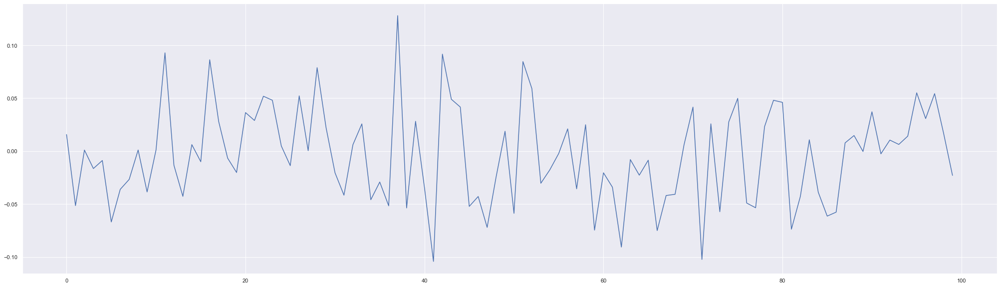

In [100]:
import seaborn as sns
from datetime import datetime, timedelta
import random


# Calculer l'écart type de la performance des trades de cette stratégie
performanceStd = round((trades_df["resultat%"]/100).std(), 4)
print(performanceStd)

#  Calcul du nombre de trades ces 365 derniers jours
nbTradesPastYear = len(trades_df[trades_df["date_and_time"]> (datetime.now()-timedelta(days=365))])
print(nbTradesPastYear)

#Trader d'une loi normale avec comme paramèetres moyenne=0, ecart type = 0,06, taille de l'échantillon = 100 
fig = plt.figure(figsize =(35,10))
print(plt.plot(np.random.normal(0,performanceStd, 100))) 
# random.normal function documentation: https://www.educative.io/answers/what-is-the-randomnormal-function-in-numpy


In [101]:
# ***************************************************************************************** #
# *** DEFINITION D'UNE FONCTION SIMULANT LES POSSIBLES FUTURS TRADES DE CETTE STRATEGIE *** #
# ***************************************************************************************** #

# Cette fonction prend comme paramètres d'entrée
# - La liste des trades historiques issus du backtest sur une période donnée
# - Un multiplicateur qui permet d'avoir plus de données dans le data set
# - nb_trades_to_forecast : nombre de trades à forecast. Comme on a 100 trades par an, simuler 100 trade revient a faire une simulation 1 an dans le futur
# - Le nombre de simulations à calculer (nombre de fois qu'on simule les 100 trades par ex)
# - nb_real_trades_to_show: le nombre de trades réels que l'on souhaite afficher dans le graphique 

### Comment l'utiliser ?
# Run le backtest du 1er janv 2018 jusqu'a hier 4/11/22. 
# Assigner hier (4/11/22) à simulationStartDate. On commence à simuler à partir de maintenant pour dans le futur
# Run 1000 simulations et voir les différents outcomes possibles

import seaborn as sns
from datetime import datetime, timedelta
import random

# On récupère l'historique des trades (trades_df) et on le nettoie en enlevant toutes les valeurs NaN
clean_trades_df = None
clean_trades_df = trades_df.dropna().copy()
clean_trades_df["resultat_pct"] = clean_trades_df["resultat%"]/100

# On passe la colonne resultat en %

def plot_futur_simulations(cleaned_trades_df, trades_multiplier, nb_trades_to_forecast, number_of_simulations, nb_real_trades_to_show, show_all_simulations=False):
    
    #Set graph params
    sns.set_style("darkgrid") # set paramètres du graph
    sns.set(rc={'figure.figsize':(17,8)}) # set taille du graph

    # Defining key variables
    simulationInitalWallet = cleaned_trades_df.iloc[-1]['wallet'] # montant du wallet à la date d'aujourd'hui
    simulationStartDate = cleaned_trades_df.iloc[-1]["date_and_time"] # début de la simulation = date la plus proche, on prend celle du dernier trade
    nbTradesPastYear = len(cleaned_trades_df['resultat_pct'][cleaned_trades_df["date_and_time"] > (datetime.now()-timedelta(days=365))])
    # nombre de trades sur l'année dernière
    avgNbTradesPerDay = nbTradesPastYear/365  # calcul du nombre moyen de trades par jour (=0.265 trades par jour, soit 1 trade tous les 3.8 jours)
    nbHoursBetweenEachTrade = int(24/avgNbTradesPerDay) # Calcul du nombre d'heures qui sépare chaque trade (24/0.265, soit environ 90 heures)

    # On fait la liste des dates futures des trades qui vont être simulés
    # On part de la simulationStartDate à laquelle on ajoute le nombre d'heure qui espace chaque trade dans une journée (en moyenne). On répète ça 100 fois car on veut simuler 100 trades
    future_trades_dates = []
    for x in range(nb_trades_to_forecast): #(on le fait 100 fois)
        simulationStartDate = simulationStartDate + timedelta(hours=nbHoursBetweenEachTrade)
        future_trades_dates.append(simulationStartDate)
    ##Version condensée:future_trades_dates = [(simulationStartDate:=simulationStartDate+timedelta(hours=int(nbHoursBetweenEachTrade))) for x in range(nb_trades_to_forecast)]

    # Définition du trades pool, c'est à dire de la liste des trades passés (1+perf%) qu'on multiplie par 3 pour avoir un échantillon encore plus grand
    trades_pool = (cleaned_trades_df["resultat_pct"]+1).to_list() * trades_multiplier

    # Récupérer les dates des vrais trades à afficher dans le graphique (on affiche tous les trades, a partir du 100e en partant de la fin)
    real_trades_dates = cleaned_trades_df.iloc[-nb_real_trades_to_show:]["date_and_time"].to_list()
    
    # Récupérer la variation du wallet sur ces trades
    real_trades_results = cleaned_trades_df.iloc[-nb_real_trades_to_show:]["wallet"].to_list()

    mu = 0 # moyenne de la loi normale
    sigma = cleaned_trades_df["resultat_pct"].std() # standard deviation deviation de la loi normale

    simulations = {} #On stockera ici la liste de l'évolution de la valorisation des 1 000 wallets simulés - c'est une liste de listes (chaque simulated_wallet)
    result_simulation = [] # On stockera ici la valeur finale de chaque wallet simulé

    # -> On run la simulation:
    for i in range(number_of_simulations):
        # Chaque current trades pool est une sequence de trades simulée de façon quasi aléatoire (1 simulation)
        # The .sample() method returns a list with a randomly selection of a specified number of items from a sequence
        current_trades_pool = random.sample(trades_pool, nb_trades_to_forecast) 
        noise_result = np.random.normal(mu, sigma, len(current_trades_pool))
        current_trades_pool = current_trades_pool + noise_result # on ajoute du bruit a la current_trades_pool

        # Oour chaque future_trades_date on calcule le % d'évolution du wallet par rapport au Simulation Initial Wallet
        curr = 1
        current_trades_result = []
        for v in current_trades_pool:
            curr = curr*v
            current_trades_result.append(curr)
        # version condensée: current_trades_result = [(curr:=curr*v) for v in current_trades_pool]

        # Pour chaque future trades date on calcule le simulated wallet
        simulated_wallet = [x*simulationInitalWallet for x in current_trades_result]
        # On ajoute au dictionnaire qui liste l'évolution du portefeuille simulé dans le temps le simulated wallet
        simulations[i] =  simulated_wallet
        # on ajoute a la liste des résultats des simulations la derniere valeur du portefeuille (pour ensuite pouvoir ranker les simulations par performance)
        result_simulation.append({"key": i, "result": simulated_wallet[-1]})

        # Si show_all_simulations = TRUE, affiche sur le graphique l'évolution des trades réels et simulés au cours du temps - à leur date respective
        # On garde ce plot dans le for des simulations pour tracer les courbes les unes apres les autres apres la génération de chaque simulation
        if show_all_simulations:
            plt.plot(real_trades_dates+future_trades_dates, real_trades_results+simulated_wallet)

    # Si show_all_simulations = FALSE, on trie les simulations selon leur performance    
    if show_all_simulations == False:
        # ici on tri les simulations par resultat croissant
         sorted_simul_result = sorted(result_simulation, key=lambda d: d['result']) 
         simulation_breakdown = int(len(sorted_simul_result)/10) #on coupe le dataset des résultats des simulations en 10 (elles sont distribuées toutes les 100 simu s'il y en a 1000)
         # On souhaite récupérer l'identifiant des simulations suivantes:
         # La pire des simulations, la simulation supérieure à 10% des simulations, celle supérieure à 20%, etc.. jusqu'a , 
         for i in range(10): # range(10) itère de 0 à 9
             index_to_show = i*simulation_breakdown
            #  if index_to_show>=len(sorted_simul_result):
            #      index_to_show = len(sorted_simul_result)-1
             if i != 9:
                 plt.plot(real_trades_dates+future_trades_dates, real_trades_results+simulations[sorted_simul_result[index_to_show]["key"]])

    plt.show()

## Documentation
## Assignment operator ':=' enables to assign a value to a variable within a statement in order to save time / lines of code
## More information here: https://docs.python.org/3/whatsnew/3.8.html
  

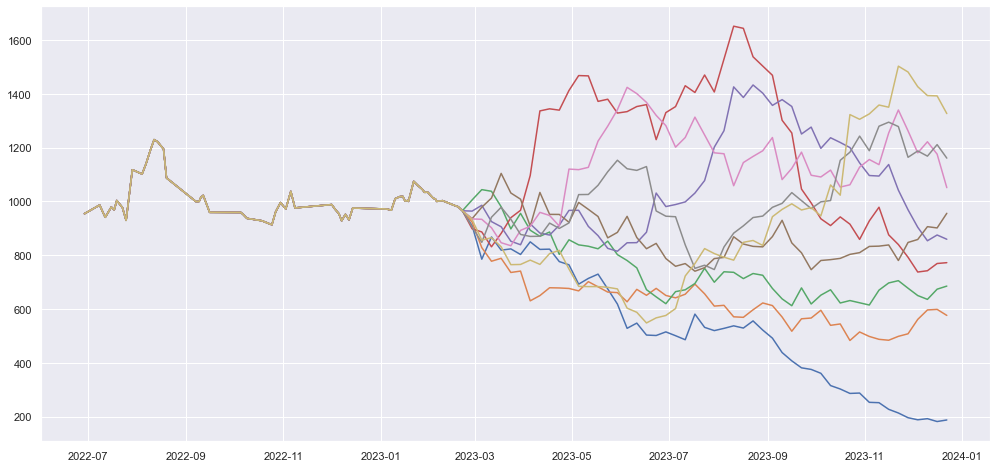

In [102]:
plot_futur_simulations(
    cleaned_trades_df= clean_trades_df,
    trades_multiplier=3,
    nb_trades_to_forecast=50,
    number_of_simulations=1000,
    nb_real_trades_to_show=100,
    show_all_simulations=False
)

In [103]:
# ********************************************* # 
# ****** Train Test Function ***************#
# ********************************************* # 

## Pourquoi faire un train test ?
# Ca permet de vérifier que les résultats obtenus par le bot sur des dates postérieure au dernier jour de train sont conformes avec les simulations.
# Données de train: les données du trades_pool, qui sont donc avant  la train_test_start_date
# Données de test: les données simulées, qui sont les simulations générées parès la train_test_start_date
# Ce que le bot a fait en réalité entre la train_test_start_date et la date de maintenant

# On récupère l'historique des trades (trades_df) et on le nettoie en enlevant toutes les valeurs NaN
clean_trades_df = None
clean_trades_df = trades_df.dropna().copy()
clean_trades_df["resultat_pct"] = clean_trades_df["resultat%"]/100

def plot_train_test_simulation(cleaned_trades_df, test_start_date, trades_multiplier, number_of_simulations):
    #Set graph parameters
    sns.set_style("darkgrid")
    sns.set(rc={'figure.figsize':(17,8)})

    # On stocke dans un data frame le jeu de données utilisé pour entrainer les simulations futures du bot
    train_df = cleaned_trades_df.loc[cleaned_trades_df["date_and_time"]<test_start_date]
    # On stocke dans un data frame les données des vrais trades réalisés par le bot après 
    test_df = cleaned_trades_df.loc[cleaned_trades_df["date_and_time"]>=test_start_date]
    # Calcul du nombre de trades a générer par simulation (on en met autant que de trades test)
    nb_trades_to_forecast = len(test_df)
    #Initial test wallet est le montant du wallet à partir de la date de test (ici le 05 aout 22)
    inital_test_wallet = train_df.iloc[-1]['wallet']
    # Nbr de trades a afficher = 2 fois le nombre de trades existants apres la date de test
    nb_trades_to_show = len(test_df)*2

    true_trades_dates = test_df["date_and_time"].to_list()

    trades_pool = ((train_df["resultat_pct"] + 1).to_list())* trades_multiplier
    train_trades_dates = train_df.iloc[-nb_trades_to_show:]["date_and_time"].to_list()
    train_trades_results = train_df.iloc[-nb_trades_to_show:]["wallet"].to_list()

    mu =0
    sigma = cleaned_trades_df["resultat_pct"].std()
    simulations = {}
    result_simulation = []

    for i in range(number_of_simulations):

        current_trades_pool = random.sample(trades_pool, nb_trades_to_forecast)
        noise_result = np.random.normal(mu, sigma, len(current_trades_pool))
        current_trades_pool = current_trades_pool + noise_result
        curr=1
        # Calcul de l'évolution de la perf du wallet simulé en % d'évolution par rapport au wallet initial 
        current_trades_result = [(curr:=curr*v) for v in current_trades_pool]
        # Calcul de l'évolution dans le temps du wallet simulé en USD
        simulated_wallet = [x*inital_test_wallet for x in current_trades_result]
        simulations[i] =  simulated_wallet
        result_simulation.append({"key": i, "result": simulated_wallet[-1]})
    
    # Tri des simulation par ordre croissant de resultat final
    sorted_simulation_results = sorted(result_simulation, key=lambda d: d['result']) 
    simulation_breakdown = int(len(sorted_simulation_results)/10)
    
    for i in range(10):
        index_to_show = i*simulation_breakdown
        # if index_to_show>=len(sorted_simulation_results):
        #     index_to_show = len(sorted_simulation_results)-1
        # Ici, pour chaque simulation, on plot la data de train et de test
        if i != 9:
            plt.plot(train_trades_dates+true_trades_dates, train_trades_results+simulations[sorted_simulation_results[index_to_show]["key"]])

    # C'est ici qu'on plot en vert la data des "vrais trades" issus du backtest, qui ont eu lieu apres la test start date   
    plt.plot(train_trades_dates+true_trades_dates, train_trades_results+test_df["wallet"].to_list(), linewidth=3.0, color="green")
    plt.show() 


In [106]:
plot_train_test_simulation(
    cleaned_trades_df=clean_trades_df,
    test_start_date="2022-06-01",
    trades_multiplier=3,
    number_of_simulations=1000,
)

IndexError: single positional indexer is out-of-bounds

In [105]:
## Document très intéressant sur les backtests de backtest en regardant la p value des sharpe ratios des simulations réalisées
# A LIRE ICI: https://pyquantnews.com/build-and-run-a-backtest-like-the-pros/

In [89]:
## *** Use CCXT to fetch price data *** ##


# Packages à télécharger
import ta
from dotenv import load_dotenv

# Packages standards
import pandas as pd
import datetime
import json
import time
from math import *
from datetime import datetime
import os
import ccxt

#*********************
# Load auth parameters 
#*********************

## Récupérer les variables d'environnement stockées dans .env
load_dotenv() # looks for a .env file and if it finds one it will load the env variables from the file and make them accessible to the project

# Initiate instance of API client -- we define the exchange object
exchange_id = 'binance'
exchange_class = getattr(ccxt, exchange_id)
exchange = exchange_class({
    'apiKey': os.getenv("BINANCE_API_KEY"),
    'secret': os.getenv("BINANCE_API_SECRET"),
    'timeout': 30000,
    'enableRateLimit': False
})

#*********************
# Define traded pair 
#*********************

coinSymbol = 'ETH'
fiatSymbol = 'USDT'
pairSymbol = f"{coinSymbol}/{fiatSymbol}"

#*************************************************************
# Get historical data and compute technical indicators 
#*************************************************************
fetch_start_date = int(datetime(2022, 12, 1, 0,0,0).timestamp()*1000) #datetime.datetime(year, month, day, hour=0, minute=0, second=0, microsecond=0))
t_frame = '1h'
lim = 1000 # nombre de périodes récupérées dans le passé (lim)
raw_pricedata = None
raw_pricedata_df = None

raw_pricedata = exchange.fetch_ohlcv(pairSymbol, timeframe=t_frame, since=fetch_start_date, limit=lim) # limit = nombre de périodes dans le passé
raw_pricedata_df = pd.DataFrame(raw_pricedata, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])

##Convert TIME and set timestamp as index
raw_pricedata_df = raw_pricedata_df.set_index(raw_pricedata_df['timestamp'])
raw_pricedata_df.index = pd.to_datetime(raw_pricedata_df.index, unit='ms')
del raw_pricedata_df['timestamp']

raw_pricedata_df

,open,high,low,close,volume
timestamp,,,,,
2022-11-30 23:00:00,1298.90,1306.51,1290.84,1294.46,38245.9635
2022-12-01 00:00:00,1294.46,1295.88,1286.21,1290.21,23868.0669
2022-12-01 01:00:00,1290.21,1292.74,1282.85,1285.77,15537.1703
2022-12-01 02:00:00,1285.77,1289.21,1281.20,1286.70,16455.1820
2022-12-01 03:00:00,1286.71,1291.00,1286.39,1288.02,17008.9651
...,...,...,...,...,...
2023-01-11 10:00:00,1335.12,1338.20,1334.38,1336.13,7356.8140
2023-01-11 11:00:00,1336.13,1338.06,1334.00,1336.45,14232.1779
2023-01-11 12:00:00,1336.44,1336.45,1332.00,1332.47,9052.0538


In [120]:

# Code smart pour récupérer la donnée sur une période plus longue
# https://manuellevi.com/how-to-get-more-data-price-data-using-ccxt/

initial_ts = int(datetime(2020, 8, 1, 0, 0, 0).timestamp()*1000)
final_ts = int(datetime(2021, 2, 18, 1, 0, 0).timestamp()*1000)
ohlcv = None # définition de la variable qui va stocker la price data à chaque itération
#ohlcv_list = [] # définition de la liste qui agrègre les ohlcv

# On fait la première itération pour initialiser la liste
ohlcv = exchange.fetch_ohlcv(pairSymbol, timeframe=t_frame, since=initial_ts, limit=1000)

#On fait une boucle pour récupérer la donnée qui n'a pas été loadée 
while True:
    from_ts = ohlcv[-1][0] # ici on récupère le timestamp le plus récent dans  la liste de données récupérées à la dernière itération. C'est à partir de cette date qu'on fait le prochain fetch
    new_ohlcv = exchange.fetch_ohlcv(pairSymbol, timeframe=t_frame, since=from_ts, limit=1000) # nouveau fetch à partir de la date la plus récente pour laquelle on a de la data
    ohlcv.extend(new_ohlcv) # on insere directement la nouvelle data dans le 
    print('ceci est un intermediate ts', datetime.fromtimestamp(new_ohlcv[-1][0]/1000))
    if new_ohlcv[-1][0] >= final_ts:# si le dernier ts du dernier batch de données est égal au final ts alors on arrête
      	break

raw_pricedata_df = None
##Convert TIME and set timestamp as index
raw_pricedata_df = pd.DataFrame(ohlcv, columns=['timestamp', 'open', 'high', 'low', 'close', 'volume'])
# ajouter le filtre sur la date ici !
raw_pricedata_df = raw_pricedata_df.set_index(raw_pricedata_df['timestamp'])
raw_pricedata_df.index = pd.to_datetime(raw_pricedata_df.index, unit='ms')
del raw_pricedata_df['timestamp']
raw_pricedata_df

print(datetime.fromtimestamp(new_ohlcv[-1][0]/1000))
print(final_ts)
print(raw_pricedata_df)

# This code will get the first 1000 rows, download them, get their last date and request the API for the data created since it. You will get this data repeated in the dataset, I like that because it allows me to know clearly where the data was stitched, but this is a personal preference.

# Once the request returns a number different from 1000, then we know we have the last data available

# Note: APIs are typically throttled. This means that if you make enough requests in a too short period of time, your request might get refused. Simply add some sleep statements to the code to make sure you're not going above your limits.

ceci est un intermediate ts 2020-10-23 06:00:00
ceci est un intermediate ts 2020-12-03 21:00:00
ceci est un intermediate ts 2021-01-14 17:00:00
ceci est un intermediate ts 2021-02-25 09:00:00
2021-02-25 09:00:00
1613606400000
                        open     high      low    close       volume
timestamp                                                           
2020-07-31 22:00:00   347.27   347.94   343.47   343.71  34030.62113
2020-07-31 23:00:00   343.71   346.68   342.60   346.33  29921.85208
2020-08-01 00:00:00   346.32   347.77   343.50   344.01  32129.07805
2020-08-01 01:00:00   344.02   346.36   343.07   345.22  15003.06970
2020-08-01 02:00:00   345.22   348.00   344.83   346.65  39598.90096
...                      ...      ...      ...      ...          ...
2021-02-25 04:00:00  1603.87  1614.27  1586.64  1591.03  43514.90529
2021-02-25 05:00:00  1590.99  1624.90  1590.99  1622.69  36818.34816
2021-02-25 06:00:00  1622.69  1628.66  1608.87  1617.93  30042.46182
2021-02-25 07:0

In [115]:
datetime.fromtimestamp(new_ohlcv[-1][0]/1000)
datetime.fromtimestamp(final_ts/1000)

datetime.datetime(2023, 2, 18, 1, 0)

In [69]:
import datetime
print(datetime.datetime(2018, 1, 1).date()) #.timestamp() #datetime.datetime(year, month, day, hour=0, minute=0, second=0, microsecond=0))
print(datetime.datetime(2018, 1, 1).timestamp() * 1000)

2018-01-01
1514761200000.0
